In [2]:
import yaml
import numpy as np 
import matplotlib.pyplot as plt
from scipy.stats import sem
import sys
sys.path.append('/home/bchun/Ben-Code/Modeling-Codes/Codes/OpenMM_Migration/repo/OpenMM/pyscript')
import analysis_script as anas
from sklearn.linear_model import LinearRegression
from scipy import stats
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
data1 = anas.dataextractor3('test1.csv')
data2 = anas.dataextractor3('test2.csv')
data3 = anas.dataextractor3('test3.csv')
data4 = anas.dataextractor3('test4.csv')
data5 = anas.dataextractor3('test5.csv')
data6 = anas.dataextractor3('test6.csv')
data7 = anas.dataextractor3('test7.csv')
data8 = anas.dataextractor3('test8.csv')
data9 = anas.dataextractor3('test9.csv')
data10 = anas.dataextractor3('test10.csv')

avgmsd1 = anas.avgrmsd(data1)
avgmsd2 = anas.avgrmsd(data2)
avgmsd3 = anas.avgrmsd(data3)
avgmsd4 = anas.avgrmsd(data4)
avgmsd5 = anas.avgrmsd(data5)
avgmsd6 = anas.avgrmsd(data6)
avgmsd7 = anas.avgrmsd(data7)
avgmsd8 = anas.avgrmsd(data8)
avgmsd9 = anas.avgrmsd(data9)
avgmsd10 = anas.avgrmsd(data10)

In [4]:
# Sigma is the parameter from LJ 12-6 eqn 
sigma = 0.8
# R of BV2 = 5-7 um so 6 um is chosen 
# Reff = 2^(1/6) * sigma 
# Factor = R_BV2 / Reff
Factor = 6/(2**(1/6)*sigma)

avglow = (np.asarray(avgmsd1)
          +np.asarray(avgmsd3)
          +np.asarray(avgmsd5)
          +np.asarray(avgmsd7)
          +np.asarray(avgmsd9))*Factor
avgmid = (np.asarray(avgmsd2)
          +np.asarray(avgmsd4)
          +np.asarray(avgmsd6)
          +np.asarray(avgmsd8)
          +np.asarray(avgmsd10))*Factor

y1 = avglow#[0:10000]
y2 = avgmid#[0:10000]
timemodel = np.arange(len(list(data1.keys())))
xm = timemodel*20


res1m = stats.linregress(xm,y1)
print("R-squared: ", res1m.rvalue**2)
print("Slope: ",res1m.slope)
print("Intercept: ",res1m.intercept)

res2m = stats.linregress(xm,y2)
print("R-squared: ", res2m.rvalue**2)
print("Slope: ",res2m.slope)
print("Intercept: ",res2m.intercept)

R-squared:  0.999004843438072
Slope:  0.024849177612390104
Intercept:  0.5489271353458207
R-squared:  0.9955168481724666
Slope:  0.0538811261257312
Intercept:  31.93766810345005


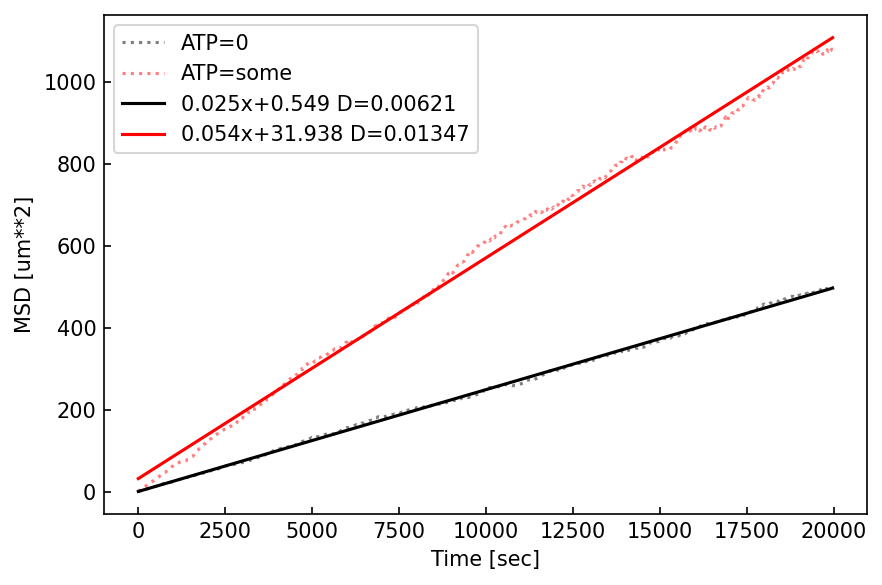

In [6]:
#time = np.arange(len(avglow))

plt.figure(figsize=(6,4),dpi=150)
plt.tick_params(direction='in')

plt.plot(timemodel*20,avglow,'k:',alpha=0.5,lw=1.5,label='ATP=0')
plt.plot(timemodel*20,avgmid,'r:',alpha=0.5,lw=1.5,label='ATP=some')

D1 = '%.5f'%(res1m.slope/4)
D2 = '%.5f'%(res2m.slope/4)

plt.plot(xm,res1m.intercept + res1m.slope*xm,'k',label=str('%.3f'%(res1m.slope))+"x+"+str('%.3f'%(res1m.intercept))+' D='+str(D1))
plt.plot(xm,res2m.intercept + res2m.slope*xm,'r',label=str('%.3f'%(res2m.slope))+"x+"+str('%.3f'%(res2m.intercept))+' D='+str(D2))
plt.legend(loc=0)
plt.xlabel('Time [sec]')
plt.ylabel('MSD [um**2]')
plt.tight_layout()

In [7]:
import sys
sys.path.append('/home/bchun/.local/lib/python3.6/site-packages/')
sys.path.append('/home/bchun/Downloads/trackpy/')
sys.path.append('/usr/lib/python36.zip')
sys.path.append('/usr/lib/python3.6')
sys.path.append('/usr/lib/python3.6/lib-dynload')
sys.path.append('/home/bchun/.local/lib/python3.6/site-packages')
sys.path.append('/usr/local/lib/python3.6/dist-packages') 
sys.path.append('/usr/lib/python3/dist-packages')
sys.path.append('/home/bchun/.local/lib/python3.6/site-packages/IPython/extensions')
sys.path
from matplotlib import rcParams
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import DataFrame, Series  # for convenience

import pims
import trackpy as tp

In [8]:
path='/home/bchun/Ben-Code/Modeling-Codes/Codes/Migration_tiff/low/'

density = ['A','B','C']
fld = ['1','2','3','4','5']
ATPno = ['1','2']
ATPyes = ['3','4','5','6']

framesA11 = pims.open(path+'A1_fld1.tiff')
framesA12 = pims.open(path+'A1_fld2.tiff')
framesA13 = pims.open(path+'A1_fld3.tiff')
framesA14 = pims.open(path+'A1_fld4.tiff')
framesA15 = pims.open(path+'A1_fld5.tiff')

framesA21 = pims.open(path+'A2_fld1.tiff')
framesA22 = pims.open(path+'A2_fld2.tiff')
framesA23 = pims.open(path+'A2_fld3.tiff')
framesA24 = pims.open(path+'A2_fld4.tiff')
framesA25 = pims.open(path+'A2_fld5.tiff')

framesA31 = pims.open(path+'A3_fld1.tiff')
framesA32 = pims.open(path+'A3_fld2.tiff')
framesA33 = pims.open(path+'A3_fld3.tiff')
framesA34 = pims.open(path+'A3_fld4.tiff')
framesA35 = pims.open(path+'A3_fld5.tiff')

framesA41 = pims.open(path+'A4_fld1.tiff')
framesA42 = pims.open(path+'A4_fld2.tiff')
framesA43 = pims.open(path+'A4_fld3.tiff')
framesA44 = pims.open(path+'A4_fld4.tiff')
framesA45 = pims.open(path+'A4_fld5.tiff')

framesA51 = pims.open(path+'A5_fld1.tiff')
framesA52 = pims.open(path+'A5_fld2.tiff')
framesA53 = pims.open(path+'A5_fld3.tiff')
framesA54 = pims.open(path+'A5_fld4.tiff')
framesA55 = pims.open(path+'A5_fld5.tiff')

framesA61 = pims.open(path+'A6_fld1.tiff')
framesA62 = pims.open(path+'A6_fld2.tiff')
framesA63 = pims.open(path+'A6_fld3.tiff')
framesA64 = pims.open(path+'A6_fld4.tiff')
framesA65 = pims.open(path+'A6_fld5.tiff')


In [9]:
density = ['A']
fld = ['1','2','3','4','5']
ATPno = ['1','2']
ATPyes = ['3','4','5','6']

filenames_NoATP = []
filenames_YesATP = []

for dens in density:
    for f in fld:
        for ATP in ATPno:
            filenames_NoATP.append(dens+ATP+'_fld'+f+'.tiff')

for dens in density:
    for f in fld:
        for ATP in ATPyes:
            filenames_YesATP.append(dens+ATP+'_fld'+f+'.tiff')

## No ATP (low density)

In [10]:
frames = []

for filename in filenames_NoATP:
    frame = pims.open(path+filename)
    frames.append(frame)
    
print(len(frames))

10


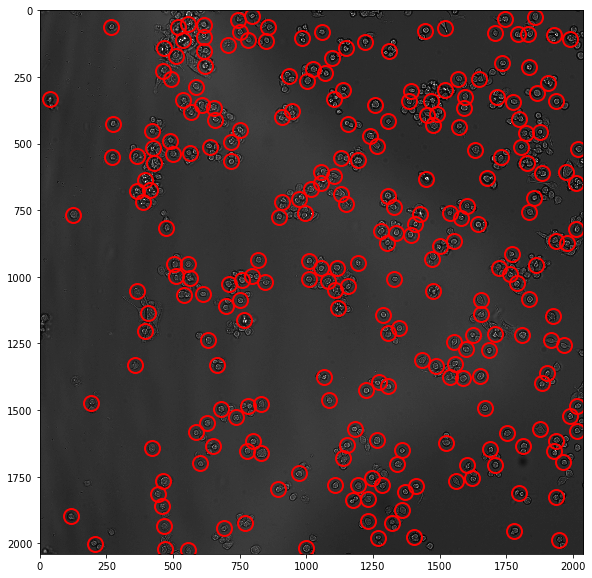

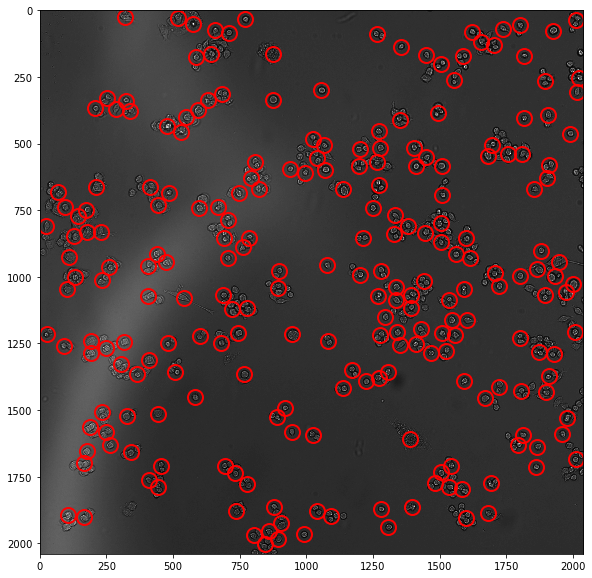

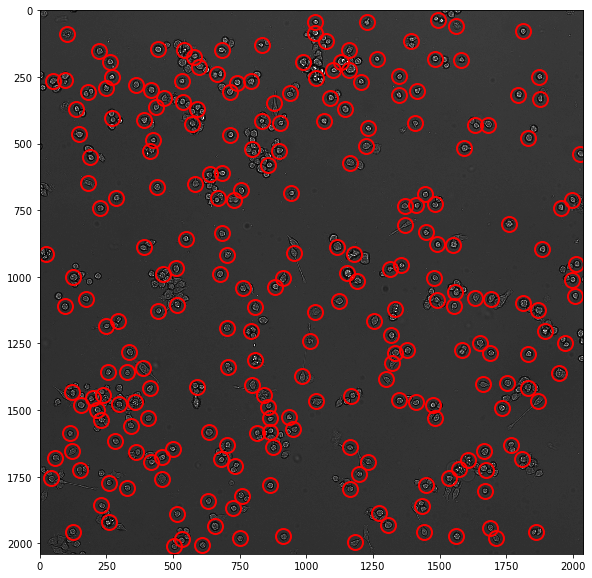

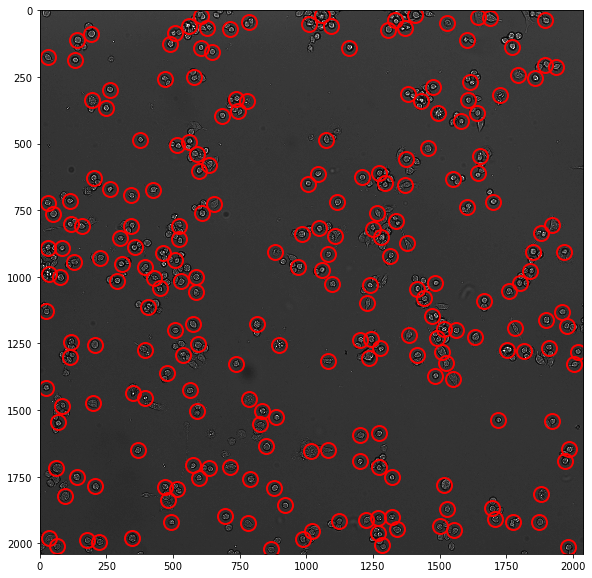

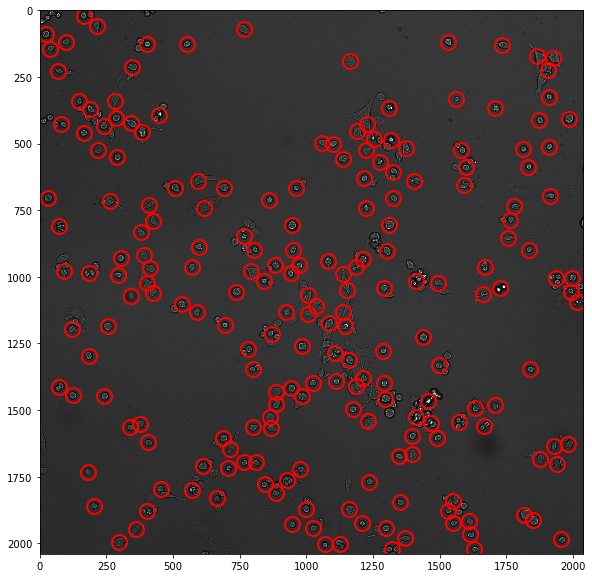

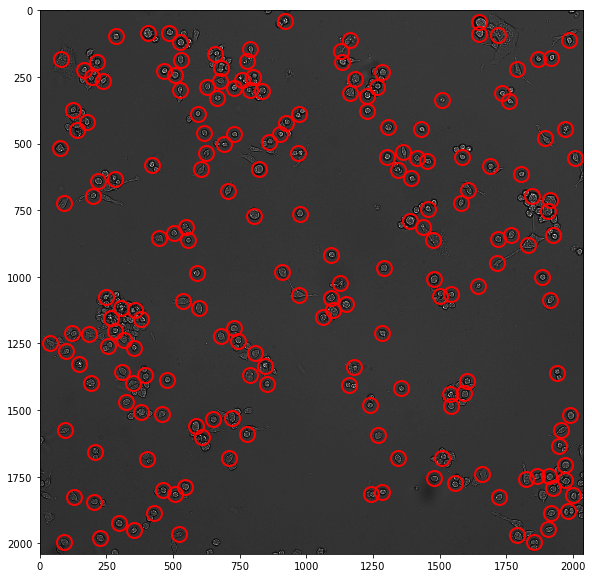

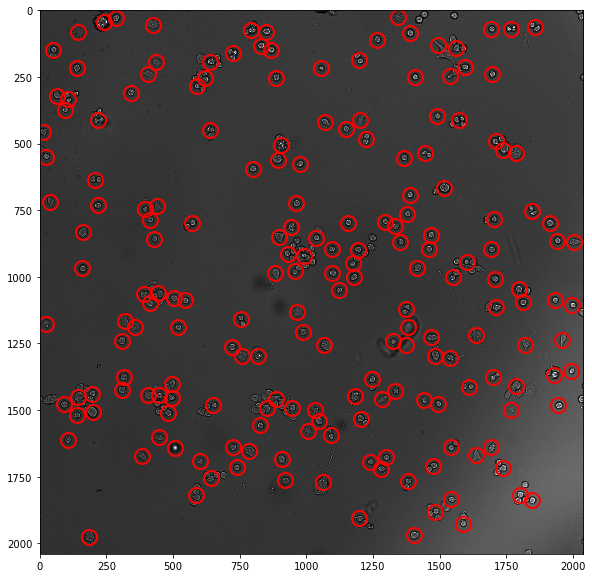

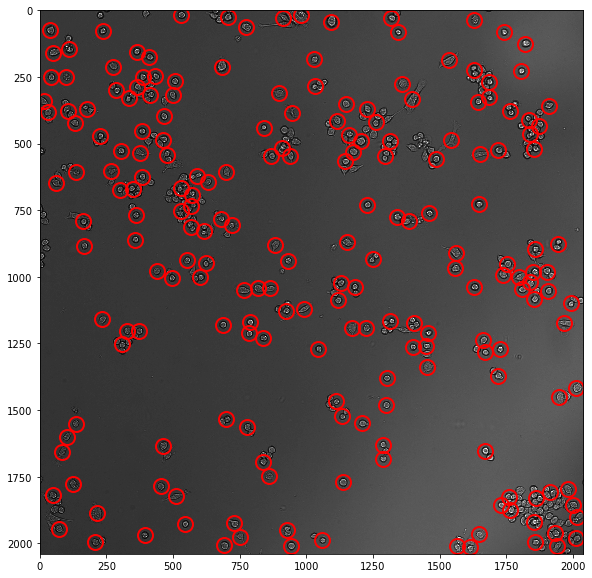

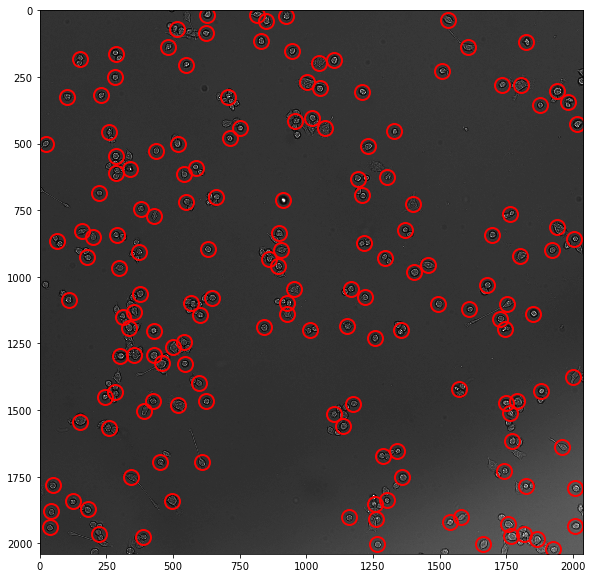

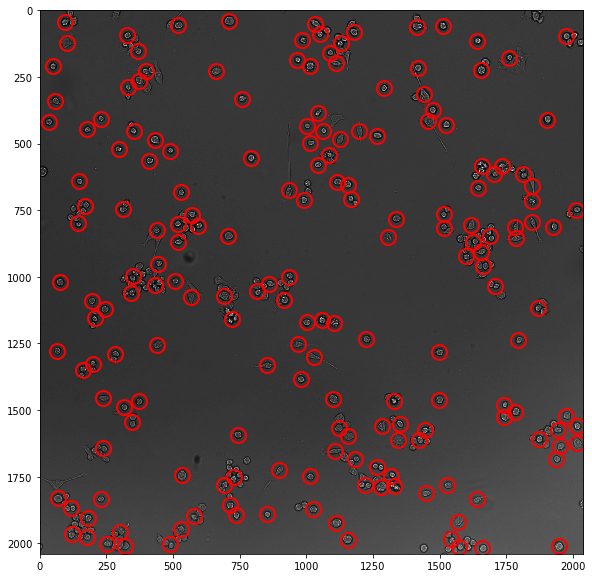

In [11]:
fs = []
rcParams['figure.figsize']=10,10
for i in np.arange(len(frames)):
    f = tp.locate(frames[i][0], 39, minmass=1e6) # Xuan suggested to use 39 as pixel size by estimating "cell size" as 1e6
    tp.annotate(f, frames[i][0]) #<--------------- Turn this on to visualize the detected cells on the frame 
    fs.append(f)

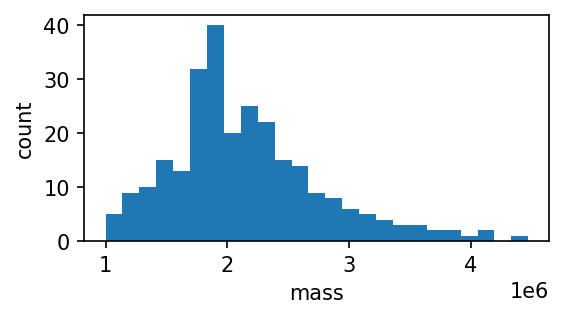

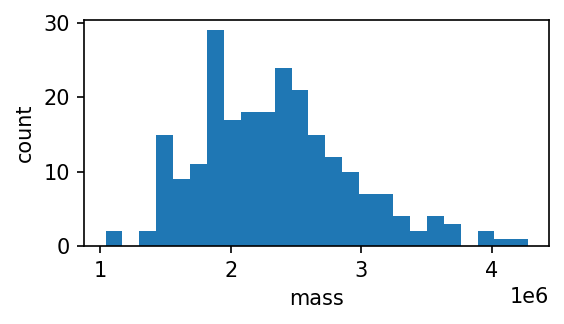

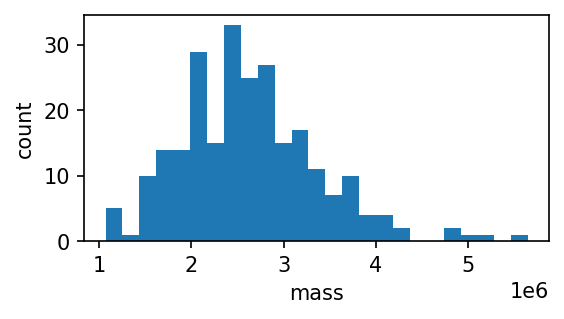

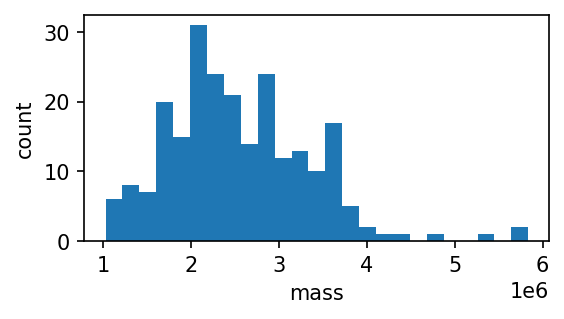

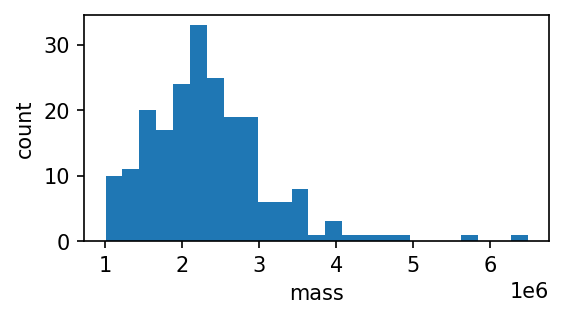

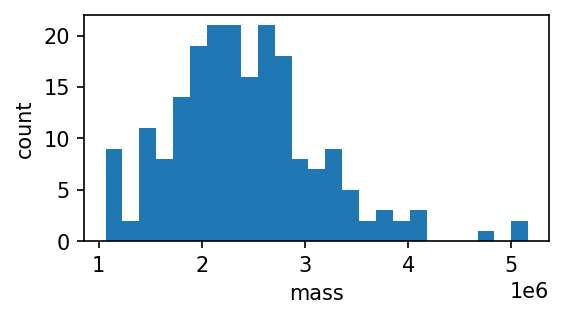

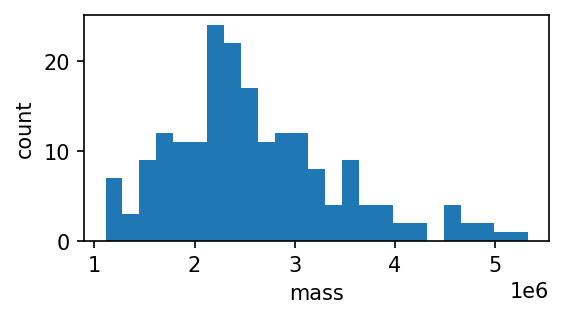

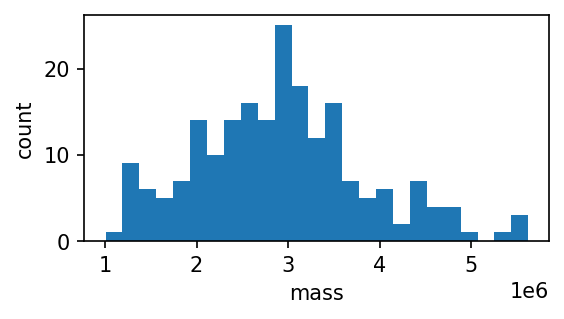

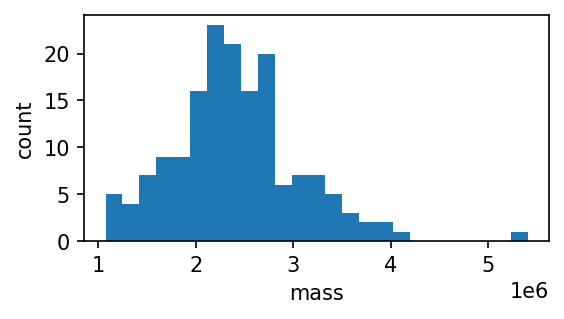

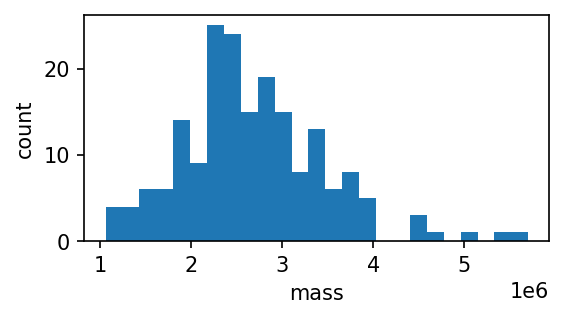

In [12]:
for i in np.arange(len(fs)):
    fig, ax = plt.subplots(figsize=(4,2),dpi=150)
    ax.hist(fs[i]['mass'], bins=25)
    # Optionally, label the axes.
    ax.set(xlabel='mass', ylabel='count');

Frame 192: 177 features


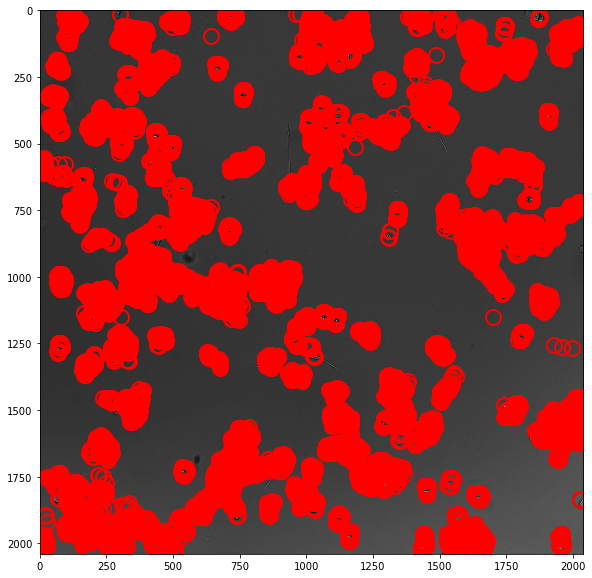

In [13]:
fb = []
rcParams['figure.figsize']=10,10
for i in np.arange(len(frames)):
    f = tp.batch(frames[i], 39, minmass=1e6)
    tp.annotate(f, frames[i][0])
    fb.append(f)

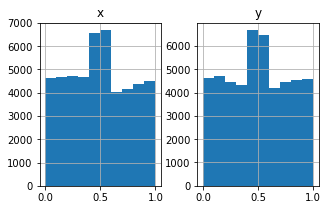

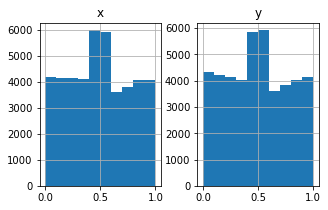

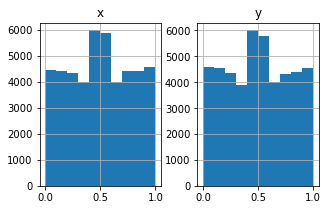

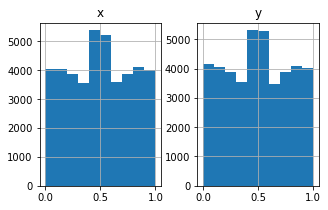

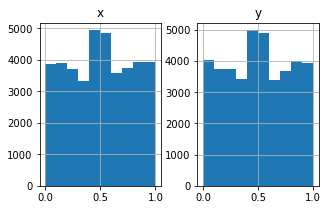

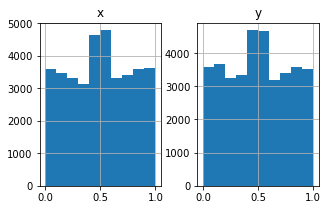

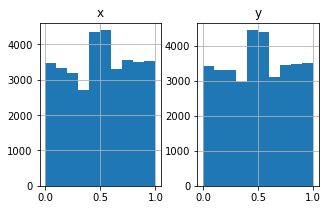

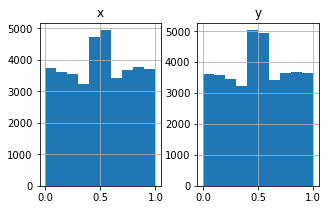

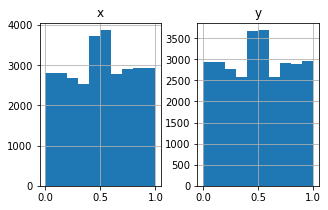

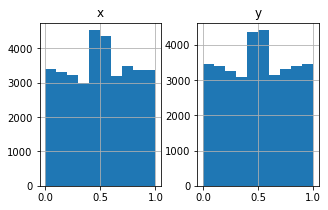

In [14]:
for f in fb:
    rcParams['figure.figsize']=5,3
    tp.subpx_bias(f)

In [15]:
rcParams['figure.figsize']=7,7

maxDist=50 # maximum displacement in pixel
maxMissFrame=200 # do not forget disappeared particles unless they've disappeared for more than maxMissFrame
msd = []
for j,f in enumerate(fb):
    t = tp.link(f, maxDist, memory=maxMissFrame)
    t1 = tp.filter_stubs(t,50)
    d = tp.compute_drift(t1)
    tm = tp.subtract_drift(t1.copy(), d)
    em = tp.emsd(tm, 0.65, 1/300)
    
    
    if j == 0:
        time1 = []
        for i in em.index:
            time1.append(i)
        
        data = []
        for i in em.values:
            data.append(i)
    
    else:
        
        data_new = []
        for i in em.values:
            data_new.append(i)
            
        data = np.asarray(data)+np.asarray(data_new)

Frame 192: 177 trajectories present.


/home/bchun/Downloads/trackpy/trackpy/motion.py:235: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.median(level=1) should use df.groupby(level=1).median().
  results = msds.mul(msds['N'], axis=0).mean(level=1)  # weighted average
/home/bchun/Downloads/trackpy/trackpy/motion.py:236: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.median(level=1) should use df.groupby(level=1).median().
  results = results.div(msds['N'].mean(level=1), axis=0)  # weights normalized


In [16]:
dataavg1=data/10

In [17]:
from scipy import stats
res1 = stats.linregress(time1,dataavg1)
print(f"R-squared: {res1.rvalue**2:.6f}")
print("Slope: ",res1.slope)
print("Intercept: ",res1.intercept)

R-squared: 0.998351
Slope:  0.020581708423093054
Intercept:  61.56480334343695


In [18]:
x1 = np.arange(30000)

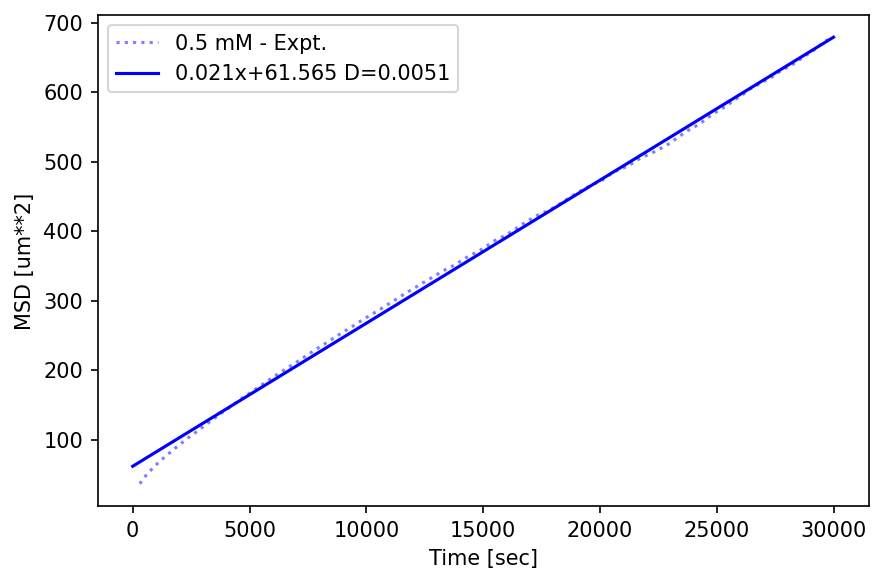

In [19]:
plt.figure(figsize=(6,4),dpi=150)
plt.plot(time1,dataavg1,'b:',alpha=0.5,label='0.5 mM - Expt.')
plt.plot(x1,res1.intercept + res1.slope*x1,'b',label=str('%.3f'%(res1.slope))+"x+"+str('%.3f'%(res1.intercept))+' D='+str('%.4f'%(res1.slope/4)))

plt.legend(loc=0)
plt.xlabel('Time [sec]')
plt.ylabel('MSD [um**2]')
plt.tight_layout()

## ATP (low density)

In [20]:
frames = []

for filename in filenames_YesATP:
    frame = pims.open(path+filename)
    frames.append(frame)
    
print(len(frames))

20


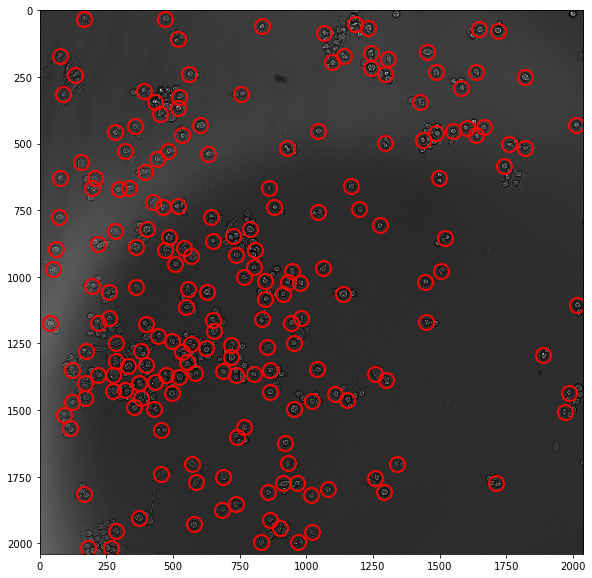

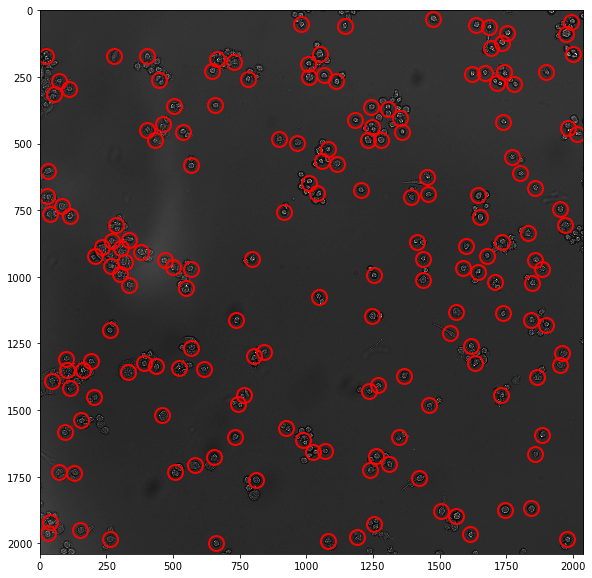

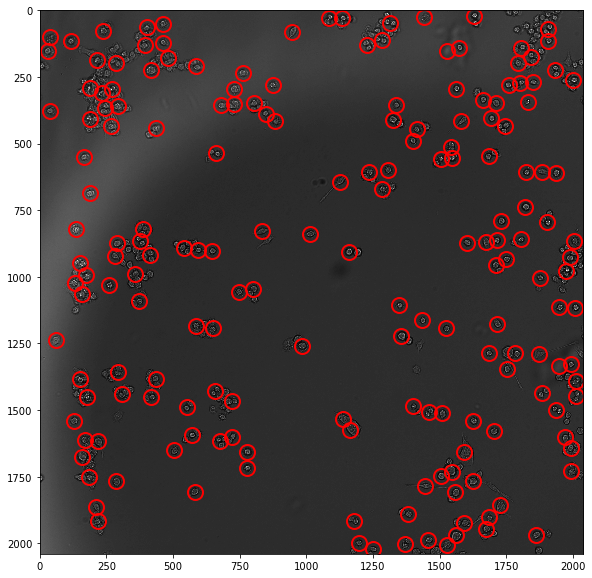

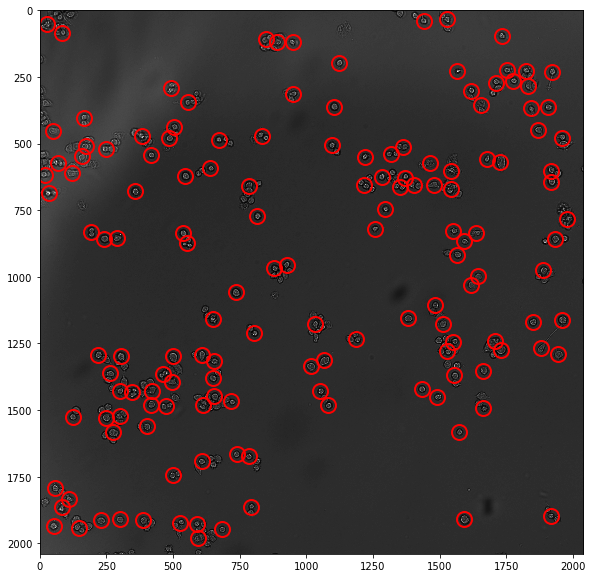

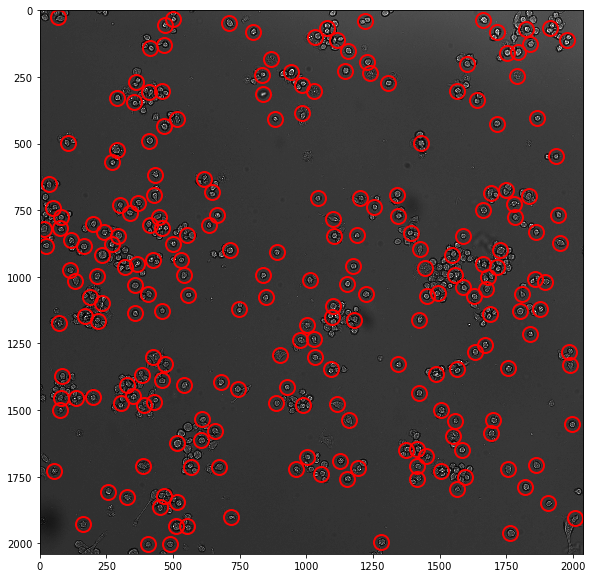

...

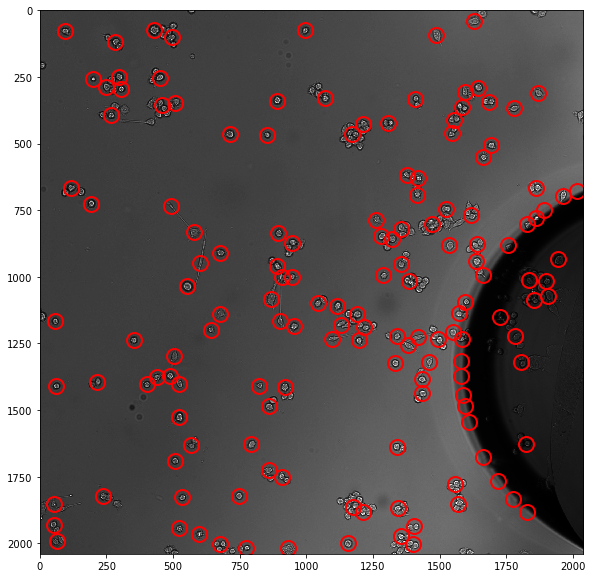

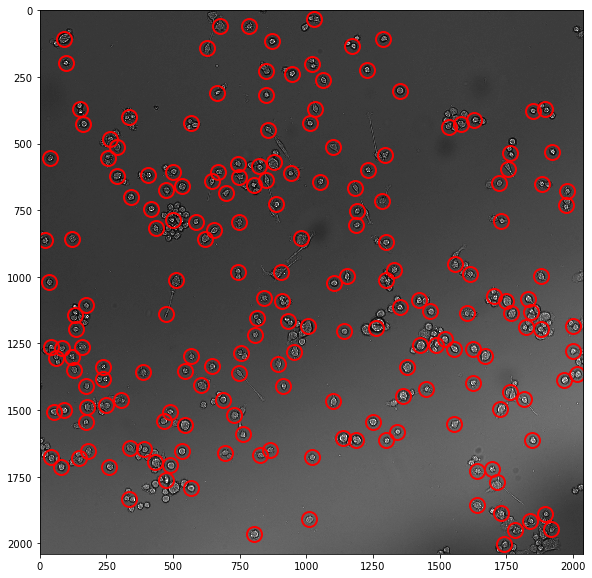

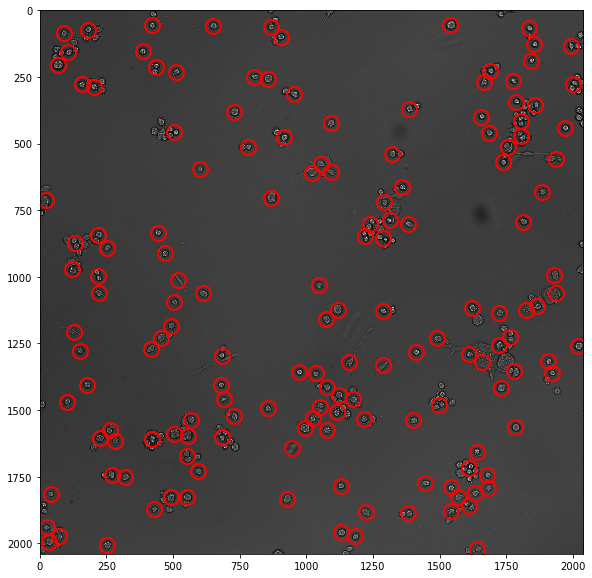

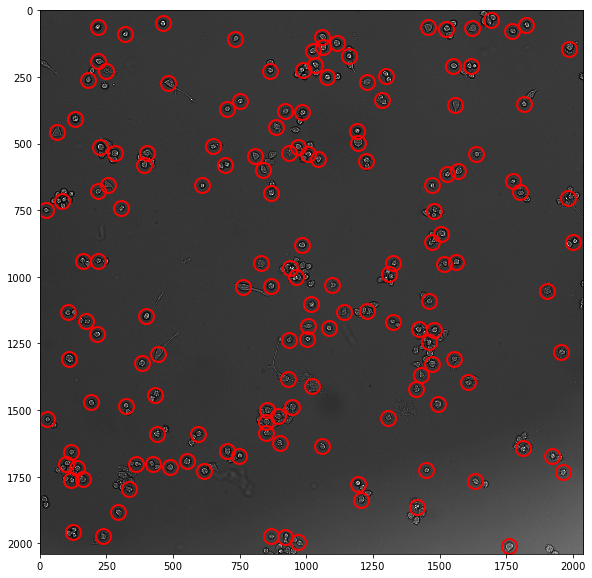

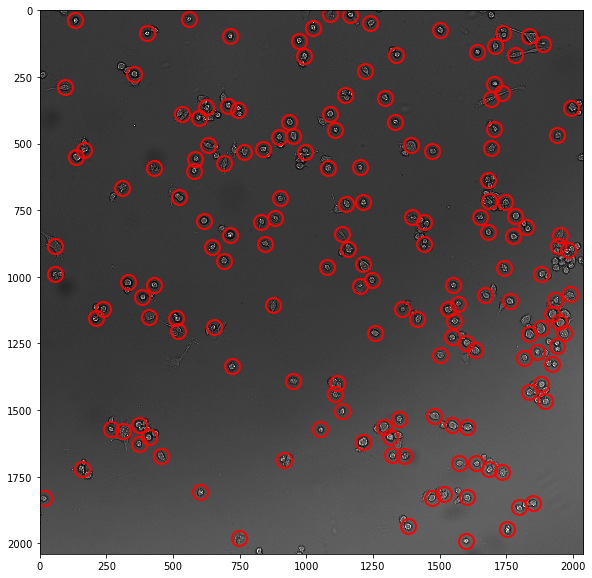

In [21]:
fs = []
rcParams['figure.figsize']=10,10
for i in np.arange(len(frames)):
    f = tp.locate(frames[i][0], 39, minmass=1e6) # Xuan suggested to use 39 as pixel size by estimating "cell size" as 1e6
    tp.annotate(f, frames[i][0]) #<--------------- Turn this on to visualize the detected cells on the frame 
    fs.append(f)

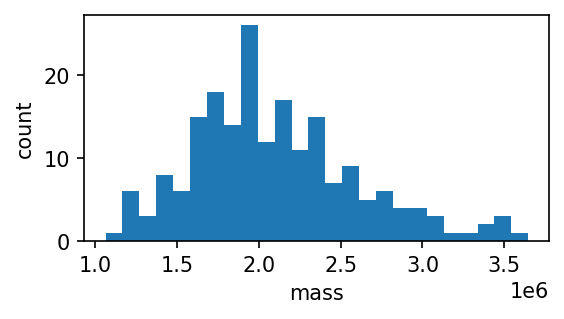

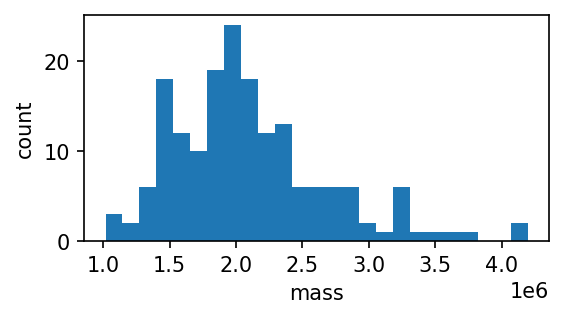

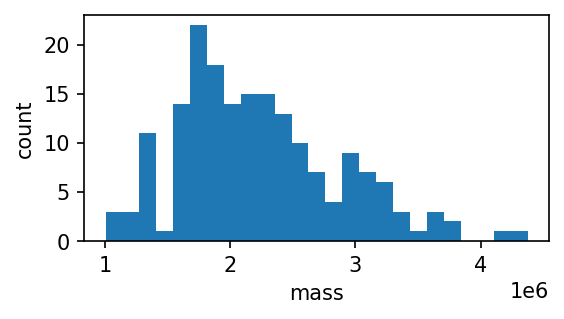

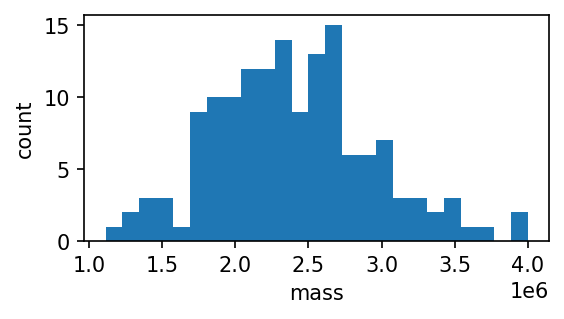

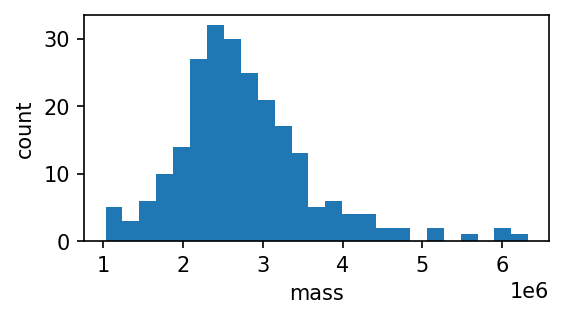

...

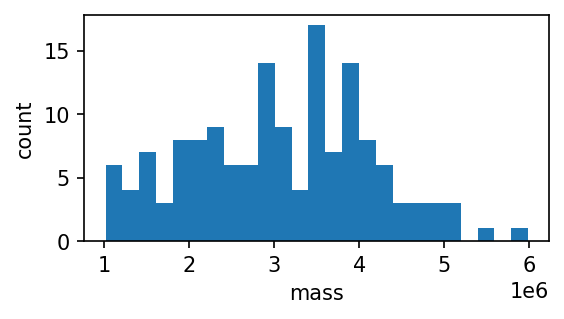

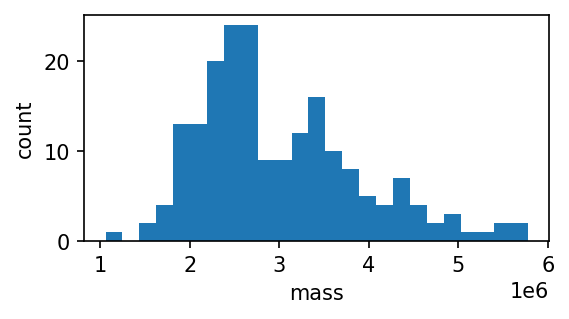

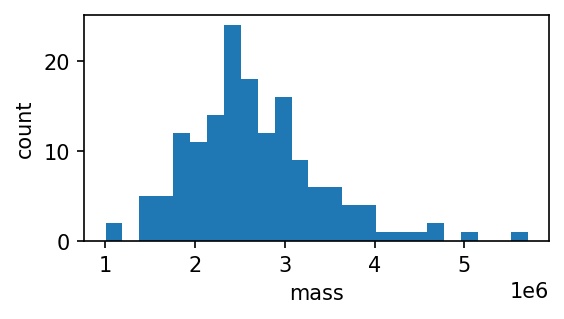

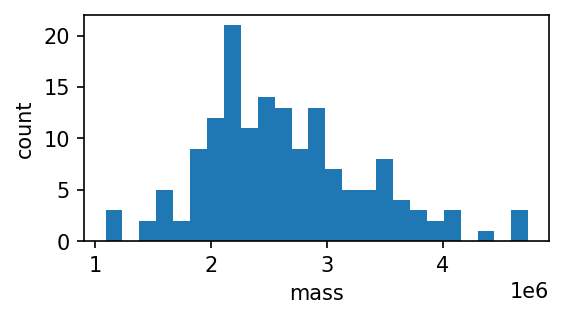

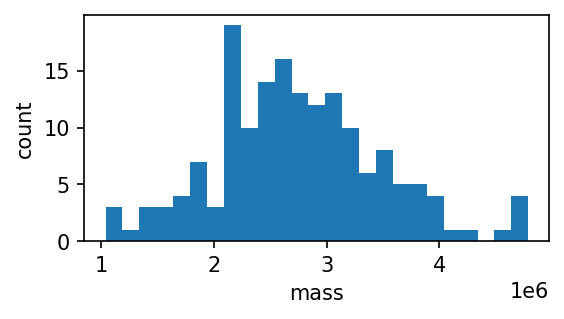

In [22]:
for i in np.arange(len(fs)):
    fig, ax = plt.subplots(figsize=(4,2),dpi=150)
    ax.hist(fs[i]['mass'], bins=25)
    # Optionally, label the axes.
    ax.set(xlabel='mass', ylabel='count');

Frame 192: 137 features


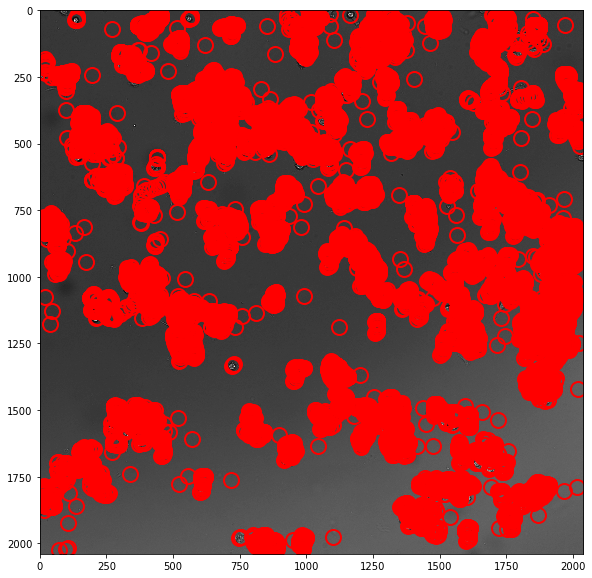

In [23]:
fb = []
rcParams['figure.figsize']=10,10
for i in np.arange(len(frames)):
    f = tp.batch(frames[i], 39, minmass=1e6)
    tp.annotate(f, frames[i][0])
    fb.append(f)

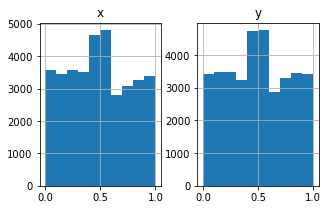

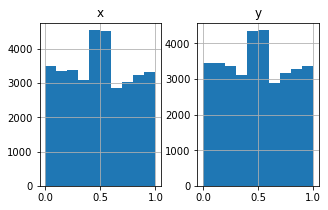

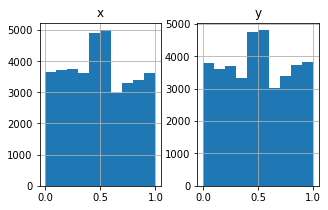

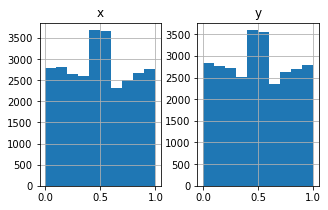

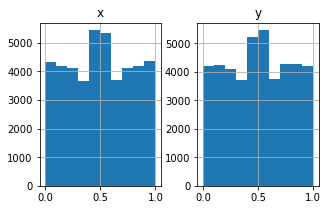

...

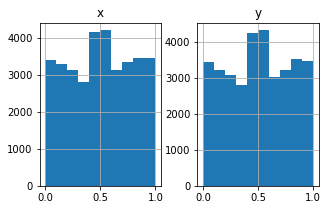

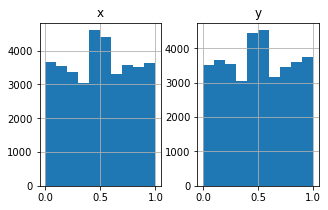

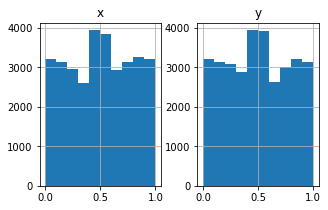

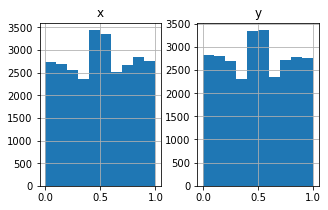

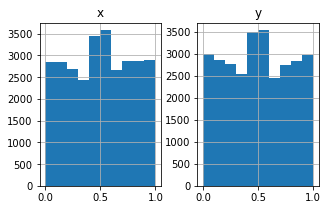

In [24]:
for f in fb:
    rcParams['figure.figsize']=5,3
    tp.subpx_bias(f)

In [ ]:
rcParams['figure.figsize']=7,7

maxDist=40 # maximum displacement in pixel
maxMissFrame=200 # do not forget disappeared particles unless they've disappeared for more than maxMissFrame
msd = []
for j,f in enumerate(fb):
    t = tp.link(f, maxDist, memory=maxMissFrame)
    t1 = tp.filter_stubs(t,50)
    d = tp.compute_drift(t1)
    tm = tp.subtract_drift(t1.copy(), d)
    em = tp.emsd(tm, 0.65, 1/300)
    
    
    if j == 0:
        time2 = []
        for i in em.index:
            time2.append(i)
        
        data = []
        for i in em.values:
            data.append(i)
    
    else:
        
        data_new = []
        for i in em.values:
            data_new.append(i)
            
        data = np.asarray(data)+np.asarray(data_new)

Frame 44: 170 trajectories present.


In [ ]:
dataavg2=data/10

In [ ]:
from scipy import stats
res2 = stats.linregress(time2,dataavg2)
print(f"R-squared: {res2.rvalue**2:.6f}")
print("Slope: ",res2.slope)
print("Intercept: ",res2.intercept)

In [ ]:
x2 = np.arange(30000)

In [ ]:
plt.figure(figsize=(6,4),dpi=150)
plt.plot(time2,dataavg2,'b:',alpha=0.5,label='0.5 mM - Expt.')
plt.plot(x2,res2.intercept + res2.slope*x2,'b',label=str('%.3f'%(res2.slope))+"x+"+str('%.3f'%(res2.intercept))+' D='+str('%.4f'%(res2.slope/4)))

plt.legend(loc=0)
plt.xlabel('Time [sec]')
plt.ylabel('MSD [um**2]')
plt.tight_layout()

In [ ]:
plt.figure(figsize=(6,4),dpi=150)

plt.plot(time1,dataavg1,'r:',alpha=0.5,label='0 mM - Expt.')
plt.plot(time2,dataavg2,'b:',alpha=0.5,label='0.5 mM - Expt.')

plt.plot(x1,res1.intercept + res1.slope*x1,'r',label=str('%.3f'%(res1.slope))+"x+"+str('%.3f'%(res1.intercept))+' D='+str('%.4f'%(res1.slope/4)))
plt.plot(x2,res2.intercept + res2.slope*x2,'b',label=str('%.3f'%(res2.slope))+"x+"+str('%.3f'%(res2.intercept))+' D='+str('%.4f'%(res2.slope/4)))

plt.plot(timemodel,avglow,'m:',alpha=0.5,lw=1.5,label='0 mM - Model')
plt.plot(timemodel,avgmid,'k:',alpha=0.5,lw=1.5,label='0.5 mM - Model')

D1 = '%.5f'%(res1m.slope/4)
D2 = '%.5f'%(res2m.slope/4)

plt.plot(xm,res1m.intercept + res1m.slope*xm,'m',label=str('%.3f'%(res1m.slope))+"x+"+str('%.3f'%(res1m.intercept))+' D='+str(D1))
plt.plot(xm,res2m.intercept + res2m.slope*xm,'k',label=str('%.3f'%(res2m.slope))+"x+"+str('%.3f'%(res2m.intercept))+' D='+str(D2))

plt.legend(loc=0)
plt.xlabel('Time [sec]')
plt.ylabel('MSD [um**2]')
plt.xlim([-100,18500])
plt.ylim([-50,1350])
plt.tight_layout()

In [ ]:
rawdata = {}
rawdata['expt_noATP'] = {}
rawdata['expt_noATP']['time'] = time1
rawdata['expt_noATP']['msd'] = dataavg1

rawdata['expt_500ATP'] = {}
rawdata['expt_500ATP']['time'] = time2
rawdata['expt_500ATP']['msd'] = dataavg2

rawdata['model_noATP'] = {}
rawdata['model_noATP']['time'] = timemodel
rawdata['model_noATP']['msd'] = avglow

rawdata['model_500ATP'] = {}
rawdata['model_500ATP']['time'] = timemodel
rawdata['model_500ATP']['msd'] = avgmid

In [ ]:
import pickle

file_to_write = open("migration_rawdata.pickle", "wb")

pickle.dump(rawdata, file_to_write)